## Getting a single frame from the video

In [2]:
from moviepy.editor import *
clip = VideoFileClip('two_lanes.mp4')
clip.ipython_display(width = 800)

Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


(720, 1280, 3)


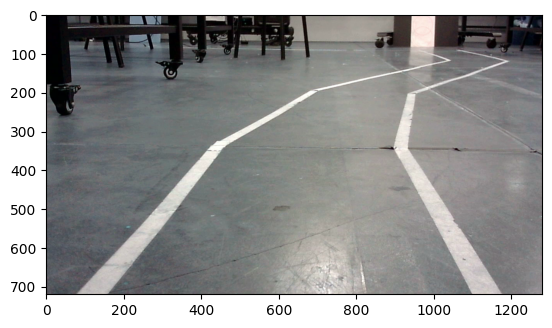

In [3]:
import cv2
import matplotlib.pyplot as plt
video_cap = cv2.VideoCapture('two_lanes.mp4')
if not video_cap.isOpened(): 
  print("Error opening video stream or file")

ret, img = video_cap.read()
plt.imshow(img)
print(img.shape)

## Define Regions of Interest (ROI)

The ROI in this case should be a rectangle with width as the same as the frame's and height equals half of the frame's height

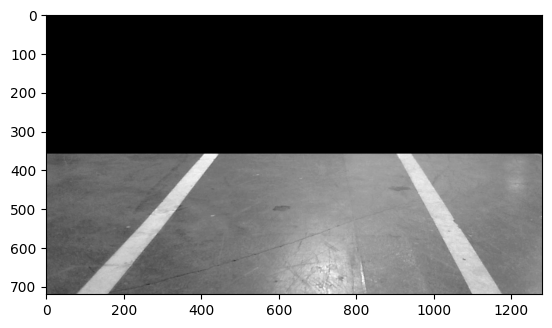

In [4]:
import numpy as np

img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
roi_vertices = np.array([[
    [0, 719],
    [0, 359],
    [1279, 359],
    [1279, 719]    
]])
ignore_mask_color = 255
if (len(img_gray.shape) > 2):
    num_channel = img_gray.shape[2]
    ignore_mask_color = (255, ) * num_channel
roi_mask = np.zeros_like(img_gray)
roi = cv2.fillPoly(roi_mask, roi_vertices, ignore_mask_color)
isolated_img = cv2.bitwise_and(roi, img_gray)
plt.imshow(isolated_img, cmap='gray')

^ There is a little bit of distortion for the left lane isn't it?

## Thresholding to take the lane only

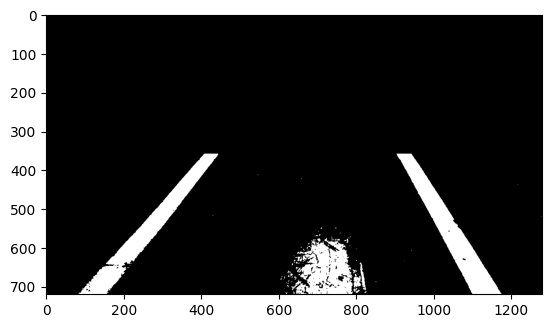

In [5]:
img_threshold = cv2.inRange(img_gray, 180, 255)
img_threshold_isolated = cv2.bitwise_and(img_threshold, roi)
plt.imshow(img_threshold_isolated, cmap='gray')

## Edge Detection

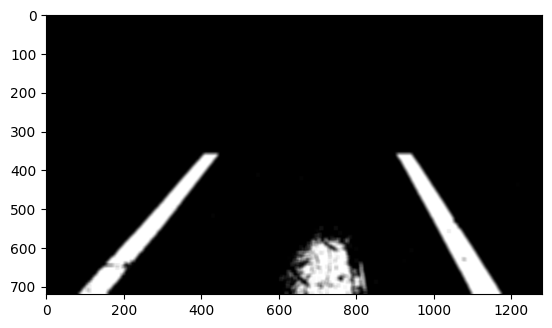

In [6]:
img_blur = cv2.GaussianBlur(img_threshold_isolated, (11, 11), 15, 15)
plt.imshow(img_blur, cmap='gray')

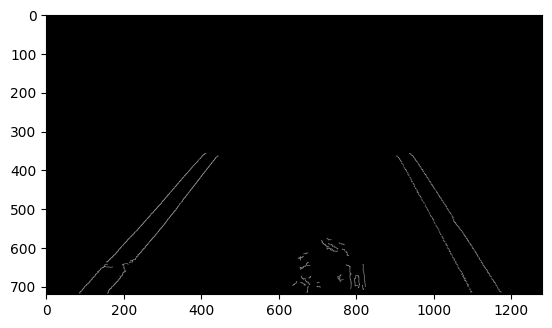

In [7]:
img_edges = cv2.Canny(img_blur, 160, 250)
plt.imshow(img_edges, cmap='gray')

## Fitting the line

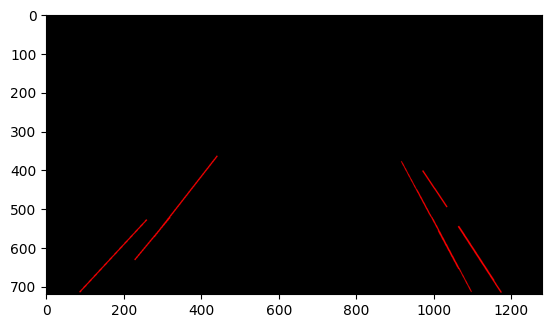

In [8]:
def draw_lines(img, lines, color = [255, 0, 0], thickness = 2):
    """Utility for drawing lines."""
    if lines is not None:
        for line in lines:
            for x1,y1,x2,y2 in line:
                cv2.line(img, (x1, y1), (x2, y2), color, thickness)
                
rho = 1
theta = np.pi / 180
threshold = 50
min_line_len = 90
max_line_gap = 10

lines = cv2.HoughLinesP(
    img_edges, rho, theta, threshold, minLineLength = min_line_len, maxLineGap = max_line_gap)


hough = np.zeros((img_edges.shape[0], img_edges.shape[1], 3), dtype = np.uint8)
draw_lines(hough, lines)
plt.imshow(hough)

## Expanding the line


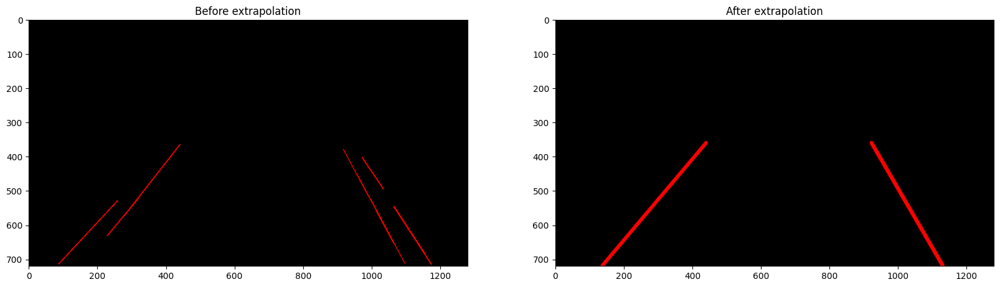

In [9]:
def separate_left_right_lines(lines):
    """Separate left and right lines depending on the slope."""
    left_lines = []
    right_lines = []
    if lines is not None:
        for line in lines:
            for x1, y1, x2, y2 in line:
                if y1 > y2: # Negative slope = left lane.
                    left_lines.append([x1, y1, x2, y2])
                elif y1 < y2: # Positive slope = right lane.
                    right_lines.append([x1, y1, x2, y2])
    return left_lines, right_lines
def cal_avg(values):
    """Calculate average value."""
    if not (type(values) == 'NoneType'):
        if len(values) > 0:
            n = len(values)
        else:
            n = 1
        return sum(values) / n
def extrapolate_lines(lines, upper_border, lower_border):
    """Extrapolate lines keeping in mind the lower and upper border intersections."""
    slopes = []
    consts = []
    
    if lines is not None:
        for x1, y1, x2, y2 in lines:
            slope = (y1-y2) / (x1-x2)
            slopes.append(slope)
            c = y1 - slope * x1
            consts.append(c)
    avg_slope = cal_avg(slopes)
    avg_consts = cal_avg(consts)
    
    # Calculate average intersection at lower_border.
    x_lane_lower_point = int((lower_border - avg_consts) / avg_slope)
    
    # Calculate average intersection at upper_border.
    x_lane_upper_point = int((upper_border - avg_consts) / avg_slope)
    
    return [x_lane_lower_point, lower_border, x_lane_upper_point, upper_border]
# Define bounds of the region of interest.
roi_upper_border = 360
roi_lower_border = 719

lanes_img = np.zeros((img_edges.shape[0], img_edges.shape[1], 3), dtype = np.uint8)

lines_left, lines_right = separate_left_right_lines(lines)

#the lane only take the middle out of the left lines
lane_left = extrapolate_lines(lines_left, roi_upper_border, roi_lower_border)
lane_right = extrapolate_lines(lines_right, roi_upper_border, roi_lower_border)
draw_lines(lanes_img, [[lane_left]], thickness = 10)
draw_lines(lanes_img, [[lane_right]], thickness = 10)

# Display results.
fig = plt.figure(figsize = (20, 20))
ax = fig.add_subplot(1, 2, 1); plt.imshow(hough); ax.set_title('Before extrapolation')
ax = fig.add_subplot(1, 2, 2); plt.imshow(lanes_img); ax.set_title('After extrapolation');
plt.show()

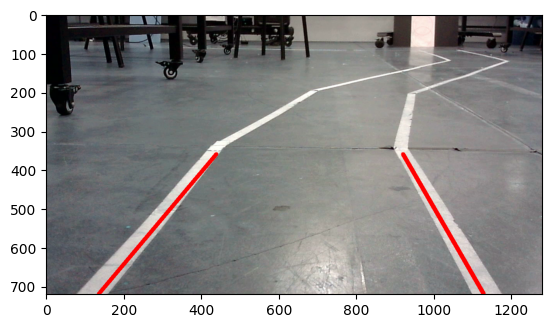

In [10]:
draw_lines(img, [[lane_left]], thickness = 10)
draw_lines(img, [[lane_right]], thickness = 10)
plt.imshow(img)

There is a problem when the robot is taking a turn: The left lane and the right lane is not like the straigt line but more like a zigzag line. Also, it is not a good strategy to split the left lane and the right lane based on the slope.

A good strategy to split the lane is:

- Group the lines based on the slope.

- Within a single slope, the lines more on the left is on the left lane


## Counter example

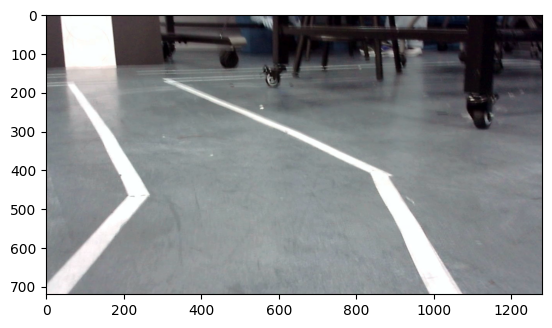

In [11]:
video_cap = cv2.VideoCapture('two_lanes.mp4')
if not video_cap.isOpened(): 
  print("Error opening video stream or file")

video_cap.set(cv2.CAP_PROP_POS_MSEC,12000) 
ret, img = video_cap.read()
plt.imshow(img)

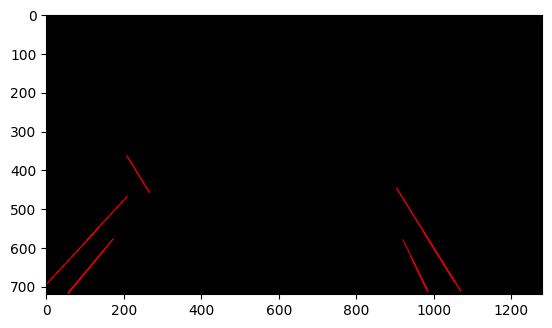

In [12]:
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
img_threshold = cv2.inRange(img_gray, 180, 255)
img_threshold_isolated = cv2.bitwise_and(img_threshold, roi)
img_blur = cv2.GaussianBlur(img_threshold_isolated, (11, 11), 15, 15)
img_edges = cv2.Canny(img_blur, 160, 250)

rho = 1
theta = np.pi / 180
threshold = 50
min_line_len = 90
max_line_gap = 10

lines = cv2.HoughLinesP(
    img_edges, rho, theta, threshold, minLineLength = min_line_len, maxLineGap = max_line_gap)


hough = np.zeros((img_edges.shape[0], img_edges.shape[1], 3), dtype = np.uint8)
draw_lines(hough, lines)
plt.imshow(hough)

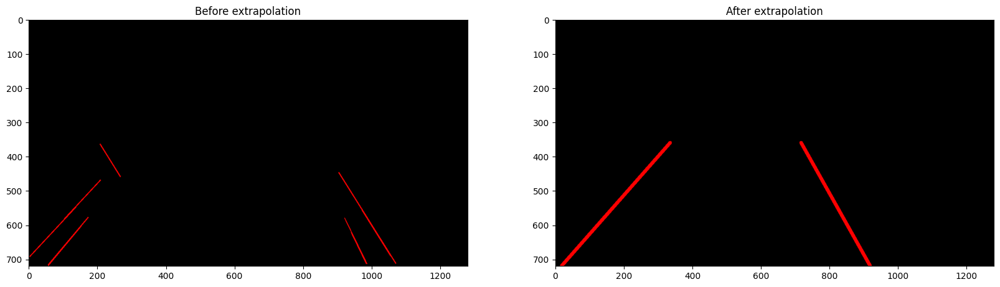

In [13]:
def separate_left_right_lines(lines):
    """Separate left and right lines depending on the slope."""
    left_lines = []
    right_lines = []
    if lines is not None:
        for line in lines:
            for x1, y1, x2, y2 in line:
                if y1 > y2: # Negative slope = left lane.
                    left_lines.append([x1, y1, x2, y2])
                elif y1 < y2: # Positive slope = right lane.
                    right_lines.append([x1, y1, x2, y2])
    return left_lines, right_lines
def cal_avg(values):
    """Calculate average value."""
    if not (type(values) == 'NoneType'):
        if len(values) > 0:
            n = len(values)
        else:
            n = 1
        return sum(values) / n
def extrapolate_lines(lines, upper_border, lower_border):
    """Extrapolate lines keeping in mind the lower and upper border intersections."""
    slopes = []
    consts = []
    
    if lines is not None:
        for x1, y1, x2, y2 in lines:
            slope = (y1-y2) / (x1-x2)
            slopes.append(slope)
            c = y1 - slope * x1
            consts.append(c)
    avg_slope = cal_avg(slopes)
    avg_consts = cal_avg(consts)
    
    # Calculate average intersection at lower_border.
    x_lane_lower_point = int((lower_border - avg_consts) / avg_slope)
    
    # Calculate average intersection at upper_border.
    x_lane_upper_point = int((upper_border - avg_consts) / avg_slope)
    
    return [x_lane_lower_point, lower_border, x_lane_upper_point, upper_border]
# Define bounds of the region of interest.
roi_upper_border = 360
roi_lower_border = 719

lanes_img = np.zeros((img_edges.shape[0], img_edges.shape[1], 3), dtype = np.uint8)

lines_left, lines_right = separate_left_right_lines(lines)

#the lane only take the middle out of the left lines
lane_left = extrapolate_lines(lines_left, roi_upper_border, roi_lower_border)
lane_right = extrapolate_lines(lines_right, roi_upper_border, roi_lower_border)
draw_lines(lanes_img, [[lane_left]], thickness = 10)
draw_lines(lanes_img, [[lane_right]], thickness = 10)

# Display results.
fig = plt.figure(figsize = (20, 20))
ax = fig.add_subplot(1, 2, 1); plt.imshow(hough); ax.set_title('Before extrapolation')
ax = fig.add_subplot(1, 2, 2); plt.imshow(lanes_img); ax.set_title('After extrapolation');
plt.show()

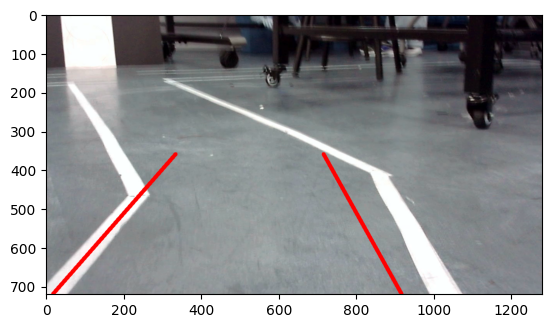

In [14]:
draw_lines(img, [[lane_left]], thickness = 10)
draw_lines(img, [[lane_right]], thickness = 10)
plt.imshow(img)

## Take a step back


What are the potential problems?

- The min_line_len is too small in the Hough Transform, therefore little change
in direction is not detected

- Problems in extending the line

## Setting smaller min_line_len

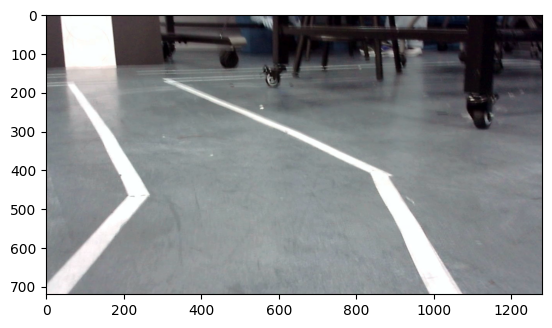

In [15]:
video_cap = cv2.VideoCapture('two_lanes.mp4')
if not video_cap.isOpened(): 
  print("Error opening video stream or file")

video_cap.set(cv2.CAP_PROP_POS_MSEC,12000) 
ret, img = video_cap.read()
plt.imshow(img)

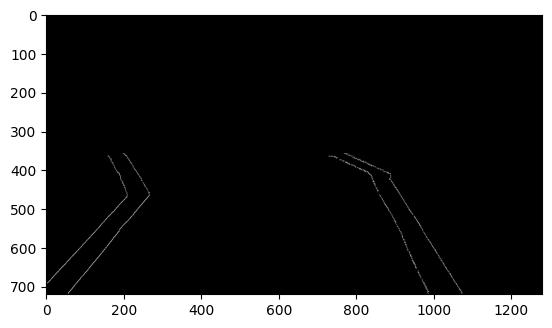

In [16]:
img_edges = cv2.Canny(img_blur, 120, 250)
plt.imshow(img_edges, cmap='gray')

(74, 1, 4)


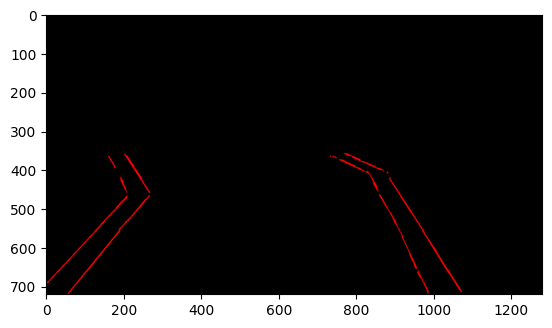

In [17]:
rho = 1
theta = np.pi / 180
threshold = 20
min_line_len = 0
max_line_gap = 5

lines = cv2.HoughLinesP(
    img_edges, rho, theta, threshold, minLineLength = min_line_len, maxLineGap = max_line_gap)

print(lines.shape)

hough = np.zeros((img_edges.shape[0], img_edges.shape[1], 3), dtype = np.uint8)
draw_lines(hough, lines)
plt.imshow(hough)

[360, 370, 380, 390, 400, 410, 420, 430, 440, 450, 460, 470, 480, 490, 500, 510, 520, 530, 540, 550, 560, 570, 580, 590, 600, 610, 620, 630, 640, 650, 660, 670, 680]
[203.0, 195.0, 201.0, 209.6, 230.0, 236.5, 231.77777777777777, 217.3, 224.22222222222223, 236.85714285714286, 266.5, 232.11111111111111, 226.5, 217.5, 211.88888888888889, 199.5, 187.44444444444446, 187.5, 169.0, 159.55555555555554, 159.66666666666666, 143.77777777777777, 141.77777777777777, 133.33333333333334, 121.0, 116.0, 107.55555555555556, 95.0, 93.1, 81.22222222222223, 68.5, 59.5, 54.888888888888886]
<class 'numpy.poly1d'>
           2
-0.002807 x + 2.365 x - 275.4


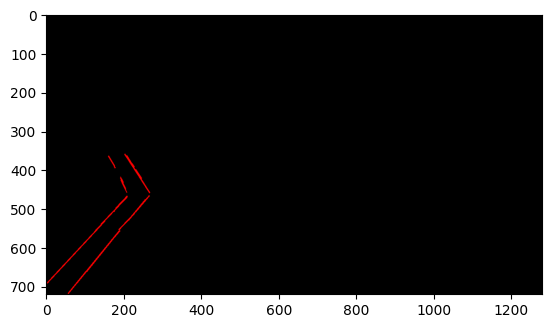

In [18]:
left_lines = lines[lines[:,0,0] < 600]
hough = np.zeros((img_edges.shape[0], img_edges.shape[1], 3), dtype = np.uint8)
draw_lines(hough, left_lines)
# draw_lines(hough, left_lines)
plt.imshow(hough)
x1 = []
y1 = []
for i in range (360, 690, 10):
    cnt = 0
    sum = 0
    for j in range(0, 600):
        if hough[i, j, 0] == 255:
            sum += j
            cnt += 1
    if (cnt > 0):
        x1.append(i)
        y1.append(sum/cnt)
print(x1)
print(y1)
left_curve  = np.poly1d(np.polyfit(x1,y1, 2))
print(type(left_curve))
print(left_curve)
for i in range(300, 700):
    for j in range(-3, 3):
        hough[i, int(left_curve(i)) + j] = [0, 255, 0]



(720, 1280)


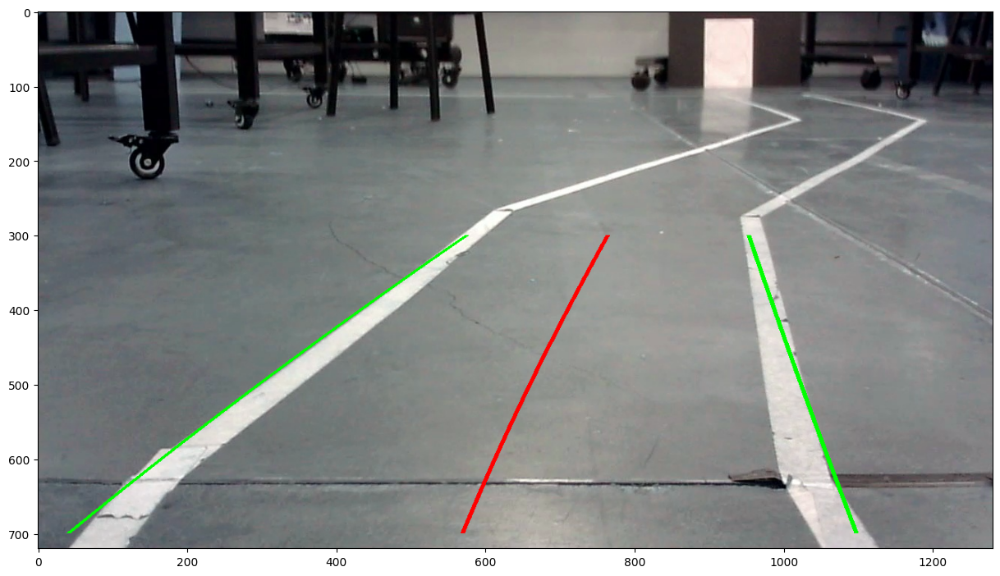

In [19]:
def draw_lines(img, lines, color = [255, 0, 0], thickness = 2):
    """Utility for drawing lines."""
    if lines is not None:
        for line in lines:
            for x1,y1,x2,y2 in line:
                cv2.line(img, (x1, y1), (x2, y2), color, thickness)
                
def process(img, width = 3):
    img = cv2.resize(img, (1280, 720))
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    print(img_gray.shape)
    img_threshold = cv2.inRange(img_gray, 180, 255)
    img_threshold_isolated = cv2.bitwise_and(img_threshold, roi)
    img_blur = cv2.GaussianBlur(img_threshold_isolated, (11, 11), 15, 15)
    img_edges = cv2.Canny(img_blur, 150, 220)

    rho = 1
    theta = np.pi / 180
    threshold = 20
    min_line_len = 0
    max_line_gap = 5

    lines = cv2.HoughLinesP(
        img_edges, rho, theta, threshold, minLineLength = min_line_len, maxLineGap = max_line_gap)

    hough = np.zeros((img_edges.shape[0], img_edges.shape[1], 3), dtype = np.uint8)
    draw_lines(hough, lines)
    # plt.imshow(hough)
    # draw_lines(hough, left_lines)
    x1 = []
    y1 = []
    for i in range (360, 690, 10):
        for j in range(0, 600):
            if hough[i, j, 0] == 255:
                x1.append(i)
                y1.append(j)
                break

    try:
        left_curve  = np.poly1d(np.polyfit(x1,y1, 2))
    except: return img
    res = img.copy()
    for i in range(300, 700):
        for j in range(-width, width):
            try:
                res[i, int(left_curve(i)) + j] = [0, 255, 0]
            except: continue
    
    x1 = []
    y1 = []
    for i in range (360, 690, 10):
        for j in range(1200, 600, -1):
            if hough[i, j, 0] == 255:
                x1.append(i)
                y1.append(j)
                break

    try:
        right_curve = np.poly1d(np.polyfit(x1,y1, 2))
    except: return img
    for i in range(300, 700):
        for j in range(-width, width):
            try:
                res[i, int(right_curve(i)) + j] = [0, 255, 0]
            except: continue
            
    for i in range(300, 700):
        for j in range(-width, width):
            try:
                res[i, int((right_curve(i) + left_curve(i)) / 2) + j] = [255, 0, 0]
            except: continue

    return res 
  
  
# video_cap = cv2.VideoCapture('two_lanes.mp4')
# if not video_cap.isOpened(): 
#   print("Error opening video stream or file")

# # Retrieve video frame properties.
# frame_w   = int(video_cap.get(cv2.CAP_PROP_FRAME_WIDTH))
# frame_h   = int(video_cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
# frame_fps = int(video_cap.get(cv2.CAP_PROP_FPS))

# # Select fourcc encoding for the mp4 file.
# # Having issues? You could also try: *'mp4v' or *'avc1'
# fourcc = cv2.VideoWriter_fourcc(*'mp4v')

# # Specify the video output filenames.
# file_out = 'lane-output.mp4'

# # Create the video writer objects.
# vid_out = cv2.VideoWriter(file_out, fourcc, frame_fps, (frame_w,frame_h))

# print("Begin processing video... Wait until 'finished' message!")
# while True:
#     ret, frame = video_cap.read()
#     if frame is None:
#         print("Finished processing video")
#         break
#     result = process(frame)
#     vid_out.write(result)

# # Close the video writer stream.
# vid_out.release()


# # Display the saved video file.
# from moviepy.editor import *
# clip = VideoFileClip(file_out)
# clip.ipython_display(width = 800)

# video_cap = cv2.VideoCapture('two_lanes.mp4')
# if not video_cap.isOpened(): 
#   print("Error opening video stream or file")

# video_cap.set(cv2.CAP_PROP_POS_MSEC,6000) 
# ret, img = video_cap.read()
img = cv2.imread('test.jpg')
plt.figure(figsize=(15,20))
v = process(img)
plt.imshow(v)

In [20]:
video_cap = cv2.VideoCapture('two_lanes.mp4')
if not video_cap.isOpened(): 
  print("Error opening video stream or file")

video_cap.set(cv2.CAP_PROP_POS_MSEC,7000) 
ret, img = video_cap.read()
plt.figure(figsize=(15,20))
v = process(img)

(720, 1280)


<Figure size 1500x2000 with 0 Axes>

## Try using contour detection

So as you can see, adjusting the min_line_len doesn't help

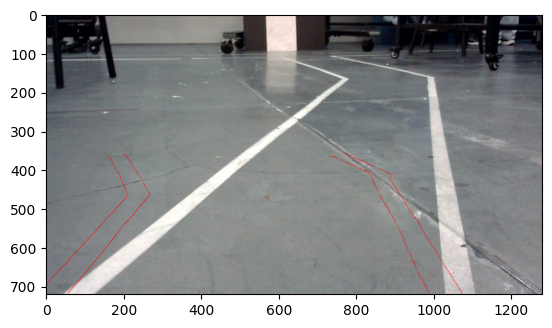

In [21]:
contours, hierarchy = cv2.findContours(img_edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
img_copy = np.copy(img)
cv2.drawContours(img_copy, contours, -1, (255,0,0), 1)
plt.imshow(img_copy)
img_copy = img_edges

That looks kinda good. But how are the contours represented?

I guess it doesn't matter. What we can do is to sweep line for each row, take the average point as the middle lane.

The time complexity for findContours is O(NM) (https://stackoverflow.com/questions/10427474/what-is-the-algorithm-that-opencv-uses-for-finding-contours). Meanwhile, the time complexity for HoughLinesP is around O(N ^ 3) where N is the number of white point. In our case, N ~ height / 2. So this finding Contours is actually better isn't it?

Drawback: findContours take into account basically everything, so the Canny Edge Detector needs to be a little bit robust

## Not fitting to different light setting

In [3]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [4]:
def draw_lines(img, lines, color = [255, 0, 0], thickness = 2):
    """Utility for drawing lines."""
    if lines is not None:
        for line in lines:
            for x1,y1,x2,y2 in line:
                cv2.line(img, (x1, y1), (x2, y2), color, thickness)
                

def draw_parabol(img, parabol, color = [0, 255, 0], thickness = 2, grain=5):
    """Utility for drawing parabol."""
    mxHeight = img.shape[0]
    step = int((mxHeight - (mxHeight >> 1)) / grain)
    x = np.arange((mxHeight >> 1) - step, mxHeight, step)
    y = parabol(x)
    points = np.column_stack((y, x)).astype(np.int32)
    cv2.polylines(img, [points], False, color, thickness)


def process(img, width = 3):
    mxHeight = img.shape[0]
    mxWidth = img.shape[1]
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    roi_vertices = np.array([[
        [0, mxHeight - 1],
        [0, mxHeight >> 1],
        [mxWidth - 1, mxHeight >> 1],
        [mxWidth - 1, mxHeight - 1]    
    ]], dtype = np.int32)

    ignore_mask_color = 255
    if (len(img_gray.shape) > 2):
        num_channel = img_gray.shape[2]
        ignore_mask_color = (255, ) * num_channel
    roi_mask = np.zeros_like(img_gray)
    roi = cv2.fillPoly(roi_mask, roi_vertices, ignore_mask_color)
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    img_threshold = cv2.inRange(img_gray, 130, 255)
    img_threshold_isolated = cv2.bitwise_and(img_threshold, roi)
    img_blur = cv2.GaussianBlur(img_threshold_isolated, (11, 11), 15, 15)
    img_edges = cv2.Canny(img_blur, 150, 220)
    

    rho = 1
    theta = np.pi / 180
    threshold = 20
    min_line_len = 0
    max_line_gap = 5

    lines = cv2.HoughLinesP(
        img_edges, rho, theta, threshold, minLineLength = min_line_len, maxLineGap = max_line_gap)

    hough = np.zeros((img_edges.shape[0], img_edges.shape[1], 3), dtype = np.uint8)
    draw_lines(hough, lines)
    
    plt.subplot(131); plt.imshow(img_gray, cmap='gray')
    plt.subplot(132); plt.imshow(img_blur, cmap='gray')
    plt.subplot(133); plt.imshow(hough, cmap='gray')

    x1 = []
    y1 = []
    for i in range (mxHeight >> 1, mxHeight - 20, 10):
        if (i > mxHeight): break
        for j in range(0, mxWidth >> 1):
            if (j > mxWidth): break
            if hough[i, j, 0] == 255:
                x1.append(i)
                y1.append(j)
                break

    try:
        left_curve  = np.poly1d(np.polyfit(x1,y1, 2))
    except: return img
    res = img.copy()
    draw_parabol(res, left_curve)

    x1 = []
    y1 = []
    for i in range (mxHeight >> 1, mxHeight - 20, 10):
        if (i > mxHeight): break
        for j in range(mxWidth - 1, mxWidth >> 1, -1):
            if (j > mxWidth): break
            if hough[i, j, 0] == 255:
                x1.append(i)
                y1.append(j)
                break

    try:
        right_curve = np.poly1d(np.polyfit(x1,y1, 2))
    except: return img
    
    draw_parabol(res, right_curve)
    draw_parabol(res, (right_curve + left_curve) / 2, [255, 0, 0])
    
    dist = ((right_curve + left_curve) / 2)(mxHeight) - (mxWidth >> 1)
    s = 'left ' if dist < 0 else 'right '
    dist = round(dist * coeff * 50, 3)
    dist = abs(dist)
    cv2.putText(res, s + str(dist) + 'mm', (20, 20), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 1, cv2.LINE_AA)
    
    return res 


import yaml
from yaml.loader import SafeLoader
with open('cam.yaml') as f:
    data = yaml.load(f, Loader=SafeLoader)

coeff = 3.858038022 / (data['camera_matrix'][0][0] / 3.858038022535227)

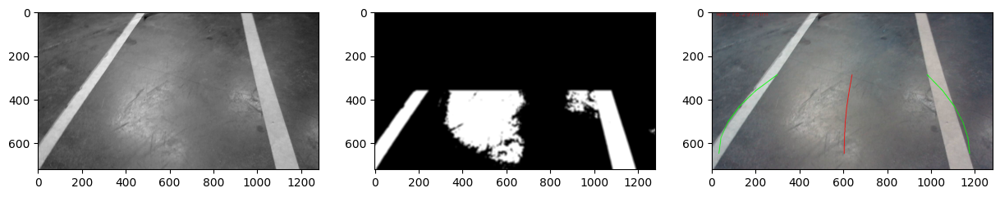

In [5]:
video_cap = cv2.VideoCapture('./sample/sample1.mp4')
if not video_cap.isOpened(): 
  print("Error opening video stream or file")

video_cap.set(cv2.CAP_PROP_POS_MSEC,5000) 
ret, img = video_cap.read()
plt.figure(figsize=(15,20))
v = process(img)
plt.imshow(process(img))

The problem seems to be because the initial threshold is too much. There are two approaches:

- Loosen the threshold: too much noise
- Use find Contour?


In [11]:
def Filter(img, len=30):
    res = img.copy()
    for j in range(0, img.shape[1]):
        cur_len = 0
        for i in range(0, img.shape[0]):
            if (img[i, j] == 255):
                cur_len += 1
            elif (cur_len < len):
                for k in range(0, cur_len):
                    res[i - k - 1, j] = 0
            if (img[i, j] == 0):
                cur_len = 0
    return res
    
def draw_lines(img, lines, color = [255, 0, 0], thickness = 2):
    """Utility for drawing lines."""
    if lines is not None:
        for line in lines:
            for x1,y1,x2,y2 in line:
                cv2.line(img, (x1, y1), (x2, y2), color, thickness)
                

def draw_parabol(img, parabol, color = [0, 255, 0], thickness = 2, grain=5):
    """Utility for drawing parabol."""
    mxHeight = img.shape[0]
    step = int((mxHeight - (mxHeight >> 1)) / grain)
    x = np.arange((mxHeight >> 1) - step, mxHeight, step)
    y = parabol(x)
    points = np.column_stack((y, x)).astype(np.int32)
    cv2.polylines(img, [points], False, color, thickness)


def process(img, width = 3):
    mxHeight = img.shape[0]
    mxWidth = img.shape[1]
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    roi_vertices = np.array([[
        [0, mxHeight - 1],
        [0, mxHeight >> 1],
        [mxWidth - 1, mxHeight >> 1],
        [mxWidth - 1, mxHeight - 1]    
    ]], dtype = np.int32)

    ignore_mask_color = 255
    if (len(img_gray.shape) > 2):
        num_channel = img_gray.shape[2]
        ignore_mask_color = (255, ) * num_channel
    roi_mask = np.zeros_like(img_gray)
    roi = cv2.fillPoly(roi_mask, roi_vertices, ignore_mask_color)
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    img_threshold = cv2.inRange(img_gray, 160, 255)
    plt.subplot(131); plt.imshow(img_threshold, cmap='gray')
    img_threshold = Filter(img_threshold)
    plt.subplot(132); plt.imshow(img_threshold, cmap='gray')
    img_threshold_isolated = cv2.bitwise_and(img_threshold, roi)
    img_blur = cv2.GaussianBlur(img_threshold_isolated, (11, 11), 15, 15)
    img_edges = cv2.Canny(img_blur, 150, 220)
    
    

    rho = 1
    theta = np.pi / 180
    threshold = 20
    min_line_len = 0
    max_line_gap = 5

    lines = cv2.HoughLinesP(
        img_edges, rho, theta, threshold, minLineLength = min_line_len, maxLineGap = max_line_gap)

    hough = np.zeros((img_edges.shape[0], img_edges.shape[1], 3), dtype = np.uint8)
    draw_lines(hough, lines)
    
    plt.subplot(133); plt.imshow(hough, cmap='gray')

    x1 = []
    y1 = []
    for i in range (mxHeight >> 1, mxHeight - 20, 10):
        if (i > mxHeight): break
        for j in range(0, mxWidth >> 1):
            if (j > mxWidth): break
            if hough[i, j, 0] == 255:
                x1.append(i)
                y1.append(j)
                break

    try:
        left_curve  = np.poly1d(np.polyfit(x1,y1, 2))
    except: return img
    res = img.copy()
    draw_parabol(res, left_curve)

    x1 = []
    y1 = []
    for i in range (mxHeight >> 1, mxHeight - 20, 10):
        if (i > mxHeight): break
        for j in range(mxWidth - 1, mxWidth >> 1, -1):
            if (j > mxWidth): break
            if hough[i, j, 0] == 255:
                x1.append(i)
                y1.append(j)
                break

    try:
        right_curve = np.poly1d(np.polyfit(x1,y1, 2))
    except: return img
    
    draw_parabol(res, right_curve)
    draw_parabol(res, (right_curve + left_curve) / 2, [255, 0, 0])
    
    dist = ((right_curve + left_curve) / 2)(mxHeight) - (mxWidth >> 1)
    s = 'left ' if dist < 0 else 'right '
    dist = round(dist * coeff * 50, 3)
    dist = abs(dist)
    cv2.putText(res, s + str(dist) + 'mm', (20, 20), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 1, cv2.LINE_AA)
    
    return res 


import yaml
from yaml.loader import SafeLoader
with open('cam.yaml') as f:
    data = yaml.load(f, Loader=SafeLoader)

coeff = 3.858038022 / (data['camera_matrix'][0][0] / 3.858038022535227)

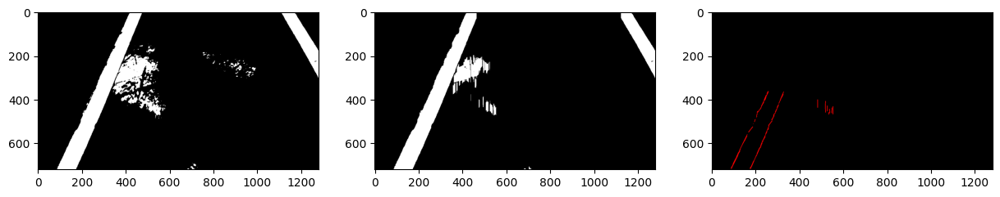

In [12]:
video_cap = cv2.VideoCapture('./sample/sample1.mp4')
if not video_cap.isOpened(): 
  print("Error opening video stream or file")

video_cap.set(cv2.CAP_PROP_POS_MSEC,2000) 
ret, img = video_cap.read()
plt.figure(figsize=(15,20))
v = process(img)
# plt.imshow(process(img))